# Figures for paper

In [3]:
%cd work/notebooks

/home/jovyan/work/notebooks


In [1]:
# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

In [5]:
# Import local code
import sys
sys.path.append('../code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from triplets import *
from mri_maps import *
from enrichments import *
from disorders import *
from brainspan import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");
%R source("../code/enrichmentsPlots.R");
%R source("../code/plot_maps.R");
%R source("../code/brainspanPlots.R");

---

## Set gradient version

In [6]:
pca = gradientVersion(approach='pca', kernel=None).fit('hcp_base')
# pca_ds9 = gradientVersion(approach='pca', kernel=None).fit('hcp_ds9')
pca_hcp_3d_ds8 = gradientVersion(approach='pca', kernel=None).fit('hcp_3donors_ds8')
dm_hcp_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_ds8')
dm_hcp_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds5')

New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=hcp_base
New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=hcp_3donors_ds8
New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_ds8
New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds5


In [7]:
# dm_hcp_ds8.clean_scores().to_csv('../outputs/ahba_dm_hcp_ds8.csv')

---

## Gradients on brains

In [21]:
versions_scores = (pd.concat({
    'PCA, all regions and genes': pca.clean_scores(),
    # 'PCA, all regions, \ntop 10% genes': pca_ds9.clean_scores(),    
    'PCA, only 3+ donor regions,\ntop 20% genes': pca_hcp_3d_ds8.clean_scores(),
    'DM, only 3+ donor regions,\ntop 50% genes': dm_hcp_3d_ds5.clean_scores(),
    'DM, all regions,\ntop 20% genes': dm_hcp_ds8.clean_scores()
    # 'DM, only top 10% DS genes,\nall regions': dm_hcp_ds9.clean_scores(),
})
        .reset_index(level=0).rename({'level_0':'version'},axis=1)
         )

In [22]:
versions_scatter = (versions_scores.set_index(['version', 'label']).stack().unstack(0)
               .iloc[:,[0,1]].reset_index(1).set_axis(['G','x','y'],axis=1)
              )

## Triplets with filtering

Load triplets data from pickles since triplets are slow to compute

In [387]:
triplets_hcp = load_pickle('triplets_hcp')
triplets_hcp_3donors = load_pickle('triplets_hcp_3donors')

In [389]:
# triplets_pca = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp, use_gradientVersion=True, approach='pca', kernel=None), with_coefs=False)
# triplets_dm = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp, use_gradientVersion=True, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)
# triplets_pca_3d = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp_3donors, use_gradientVersion=True, approach='pca', kernel=None), with_coefs=False)
# triplets_dm_3d = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp_3donors, use_gradientVersion=True, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)

KeyboardInterrupt: 

In [390]:
# triplets_dict = {
#     'PCA, all regions': triplets_pca, 
#     'PCA, only 3+ donor regions': triplets_pca_3d,
#     'DM, only 3+ donor regions': triplets_dm_3d,
#     'DM, all regions': triplets_dm
# }
# save_pickle(triplets_dict, 'triplets_dict')
triplets_dict = load_pickle('triplets_dict')

triplets_plot_v2 = (pd.concat(triplets_dict)
 .reset_index(0)
 .rename({'level_0':'method', 'version':'DS'}, axis=1)
 .assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))
                   )

triplets_highlights = [0,.8,.5,.8]
df_triplets_highlight = pd.DataFrame({'method': triplets_dict.keys(), 'DS':triplets_highlights}).assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))

## Check alignment with six brains

In [395]:
triplets_hcp_3donors_pca_ds_levels = get_triplets_ds_levels(triplets_hcp_3donors, use_gradientVersion=True, approach='pca', kernel=None)

In [408]:
triplet_corrs = {}
for name, triplet in triplets_hcp_3donors_pca_ds_levels[0.8].items():
    triplet_corrs[name] = pca_hcp_3d_ds8.corr_scores(triplet, match=True)['corr']
pd.concat(triplet_corrs, axis=1).mean(axis=1)

0    0.889598
1    0.934830
2    0.827443
3    0.314279
4    0.101378
dtype: float64

## Variance explained

In [63]:
dm_hcp_3d_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds8')

New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds8


In [76]:
dm_hcp_3d_ds8.scores.var()

0    0.001121
1    0.000107
2    0.000067
3    0.000020
4    0.000012
dtype: float64

In [81]:
pca.var / pca.expression.var().sum()

array([0.22943097, 0.10049243, 0.0821488 , 0.06295774, 0.05351861])

In [82]:
dm_hcp_3d_ds5.scores.var() / dm_hcp_3d_ds5.affinity.var()

0    0.519050
1    0.067528
2    0.040016
3    0.016764
4    0.012890
dtype: float64

In [83]:
df_var = pd.DataFrame({
    'PCA all': pca.var / pca.expression.var().sum(),
    'PCA 3+ DS8': pca_hcp_3d_ds8.var / pca_hcp_3d_ds8.expression.var().sum(),
    'DM 3+ DS8': dm_hcp_3d_ds8.scores.var().values / dm_hcp_3d_ds8.affinity.var(),
    'DM 3+ DS5': dm_hcp_3d_ds5.scores.var().values / dm_hcp_3d_ds5.affinity.var()    
}, index=[i+1 for i in range(5)]).melt(ignore_index=False).reset_index().set_axis(['PC','which','var'],axis=1)

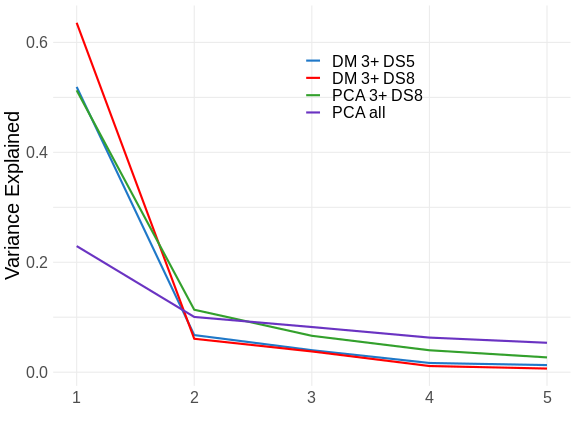

In [90]:
%%R -i df_var -w 8 -h 6 --units in
source("../code/Rplots.R")
plot_var_exp(df_var) + 
theme(text=element_text(size=20), panel.grid.minor.y=element_line())

In [99]:
df_var.set_index(['PC','which']).unstack(1)

var                               
which DM 3+ DS5 DM 3+ DS8 PCA 3+ DS8   PCA all
PC                                            
1      0.519050  0.635741   0.512860  0.229431
2      0.067528  0.060790   0.113622  0.100492
3      0.040016  0.037732   0.066201  0.082149
4      0.016764  0.011199   0.039903  0.062958
5      0.012890  0.006610   0.026907  0.053519

## Medians and mins

In [18]:
print('Median inter-triplet abs correlation:')
triplets_plot_v2.groupby(['method','component','DS']).median()['corr_abs'].unstack('DS').rename_axis('DS',axis=1)

Median inter-triplet abs correlation:


DS                                         0.0       0.1       0.2       0.3  \
method                     component                                           
PCA, all regions           1          0.721299  0.748945  0.778971  0.807344   
                           2          0.118019  0.110347  0.159537  0.171453   
                           3          0.112725  0.125533  0.117387  0.069135   
                           4          0.145199  0.139684  0.202680  0.155136   
                           5          0.298827  0.336792  0.404655  0.448716   
PCA, only 3+ donor regions 1          0.943951  0.945355  0.947445  0.950455   
                           2          0.641327  0.641444  0.650353  0.673907   
                           3          0.503075  0.532790  0.530572  0.481657   
                           4          0.216319  0.195391  0.149462  0.228965   
                           5          0.181065  0.212523  0.186532  0.161472   
DM, only 3+ donor regions  1          0.940685  0.942626  0.945676  0.949022   
                           2          0.708888  0.700856  0.720375  0.727256   
                           3          0.538432  0.545546  0.578888  0.582312   
                           4          0.241501  0.278352  0.196373  0.203824   
                           5          0.286012  0.289410  0.277343  0.240224   
DM, all regions            1          0.779787  0.797423  0.820529  0.838846   
                           2          0.088483  0.130104  0.177309  0.227700   
                           3          0.140216  0.120810  0.143634  0.136641   
                           4          0.209621  0.335855  0.459620  0.335698   
                           5          0.341715  0.362717  0.307644  0.268625   

DS                                         0.4       0.5       0.6       0.7  \
method                     component                                           
PCA, all regions           1          0.833313  0.855669  0.872687  0.887131   
                           2          0.171673  0.202981  0.307653  0.370857   
                           3          0.113449  0.144438  0.212100  0.482574   
                           4          0.227536  0.274784  0.483740  0.198496   
                           5          0.463628  0.214420  0.105736  0.162211   
PCA, only 3+ donor regions 1          0.954674  0.957945  0.962631  0.966237   
                           2          0.691238  0.731108  0.783653  0.841516   
                           3          0.513034  0.511718  0.489941  0.619852   
                           4          0.228332  0.251535  0.288700  0.348012   
                           5          0.217578  0.268531  0.247937  0.131774   
DM, only 3+ donor regions  1          0.952161  0.956226  0.959865  0.965187   
                           2          0.728530  0.726967  0.735419  0.788356   
                           3          0.591310  0.649121  0.739186  0.783818   
                           4          0.307703  0.279707  0.371345  0.478343   
                           5          0.288138  0.332532  0.374944  0.259163   
DM, all regions            1          0.853099  0.867552  0.883305  0.896041   
                           2          0.302780  0.500756  0.573062  0.631506   
                           3          0.337970  0.229351  0.310760  0.470755   
                           4          0.296952  0.311581  0.199266  0.268673   
                           5          0.282170  0.176197  0.288325  0.124677   

DS                                         0.8       0.9  
method                     component                      
PCA, all regions           1          0.900200  0.913372  
                           2          0.557307  0.795161  
                           3          0.476907  0.441650  
                           4          0.259545  0.392915  
                           5          0.145571  0.266257  
PCA, only 3+ donor regions 1          0.968536  0.971698  
      

## Versions corrs

In [51]:
for G in ['G1','G2','G3']:
    print(G)
    display(versions_scores.set_index(['label','version'])[G].unstack().corr())

G1


version,"DM, all regions,\ntop 20% DS genes","DM, only 3+ donor regions,\ntop 50% DS genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% DS genes"
version,,,,
"DM, all regions,\ntop 20% DS genes",1.000000,0.998606,0.938776,0.995127
"DM, only 3+ donor regions,\ntop 50% DS genes",0.998606,1.000000,0.955480,0.995502
"PCA, all regions and genes",0.938776,0.955480,1.000000,0.954239
"PCA, only 3+ donor regions,\ntop 20% DS genes",0.995127,0.995502,0.954239,1.000000


G2


version,"DM, all regions,\ntop 20% DS genes","DM, only 3+ donor regions,\ntop 50% DS genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% DS genes"
version,,,,
"DM, all regions,\ntop 20% DS genes",1.000000,0.936595,0.621205,0.825504
"DM, only 3+ donor regions,\ntop 50% DS genes",0.936595,1.000000,0.592491,0.954602
"PCA, all regions and genes",0.621205,0.592491,1.000000,0.499531
"PCA, only 3+ donor regions,\ntop 20% DS genes",0.825504,0.954602,0.499531,1.000000


G3


version,"DM, all regions,\ntop 20% DS genes","DM, only 3+ donor regions,\ntop 50% DS genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% DS genes"
version,,,,
"DM, all regions,\ntop 20% DS genes",1.000000,0.884856,-0.058515,0.666938
"DM, only 3+ donor regions,\ntop 50% DS genes",0.884856,1.000000,-0.079159,0.883306
"PCA, all regions and genes",-0.058515,-0.079159,1.000000,-0.013067
"PCA, only 3+ donor regions,\ntop 20% DS genes",0.666938,0.883306,-0.013067,1.000000


# Fig 1

Message: With careful processing, PC2 and PC3 of the AHBA are robust and generalizable.

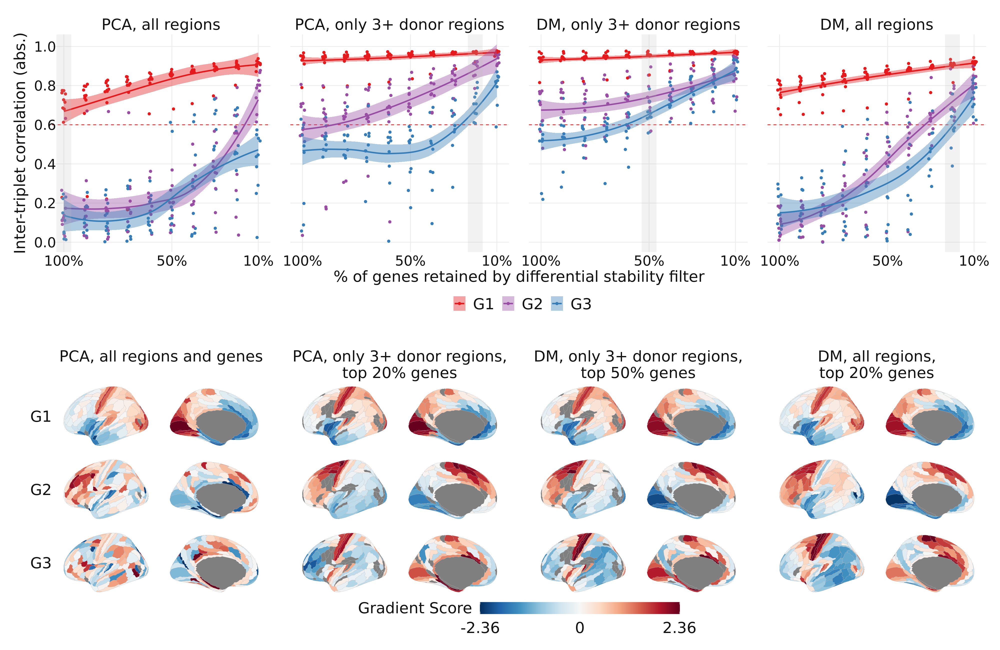

In [7]:
%%R -w 20 -h 13 --units in -r 200 -i triplets_plot_v2 -i versions_scores -i df_triplets_highlight
source("../code/Rplots.R")
source("../code/brainPlots.R")

plot_triplets_simple <- function(triplets_plot_v2, facet='h', colors=mycolors) {

    p <- triplets_plot_v2 %>%
    filter(DS == 0) %>%
    filter(component <= 3) %>%
    ggplot(aes(x=component, y=corr_abs)) +
        geom_jitter(aes(color=component), width=0.1) +
        scale_color_manual(values=colors, name='',labels=c('G1','G2','G3')) +
        scale_fill_manual(values=colors, name='',labels=c('G1','G2','G3')) +
        scale_x_discrete(labels=c('PC1','PC2','PC3')) +
        scale_y_continuous(breaks=seq(0,1,.2), 
                           # position='right',
                           name='Inter-triplet correlation (abs.)') +
        theme_minimal() + 
        theme(panel.grid.minor=element_blank(),
            axis.text=element_text(size=20, color='grey7', family='Calibri'),
              # legend.position=c(.9,.3),
              legend.position='bottom',
              # axis.text.y = element_text(margin=margin(r=-1)),
              panel.spacing=unit(2,'lines')
             )
    
    if (facet=='h') {
        p + facet_grid(.~method)
    } else if (facet=='w') {
        p + facet_wrap(~method)
    }
}
# triplets_plot_v2 %>% mutate(method=recode(method, 'PCA, all regions'='PCA, all regions and genes')) %>% head
# g2 <- plot_triplets_simple(triplets_plot_v2 %>% mutate(method=recode(method, 'PCA, all regions'='PCA, all regions and genes'))) + 
    # theme(axis.text.y=element_text(margin=margin(r=-40)))
g2 <- plot_triplets_v2(triplets_plot_v2, facet='h') + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey') +
    theme(axis.text.y=element_text(margin=margin(r=-40)))
g3 <- plot_hcp(versions_scores,# %>% rename(PC1=G1, PC2=G2, PC3=G3),
               spacing_x=2, switch='y') + 
    guides(fill=guide_colorbar(barwidth=20, title='Gradient Score', title.vjust=1))
    
(g2 / g3) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

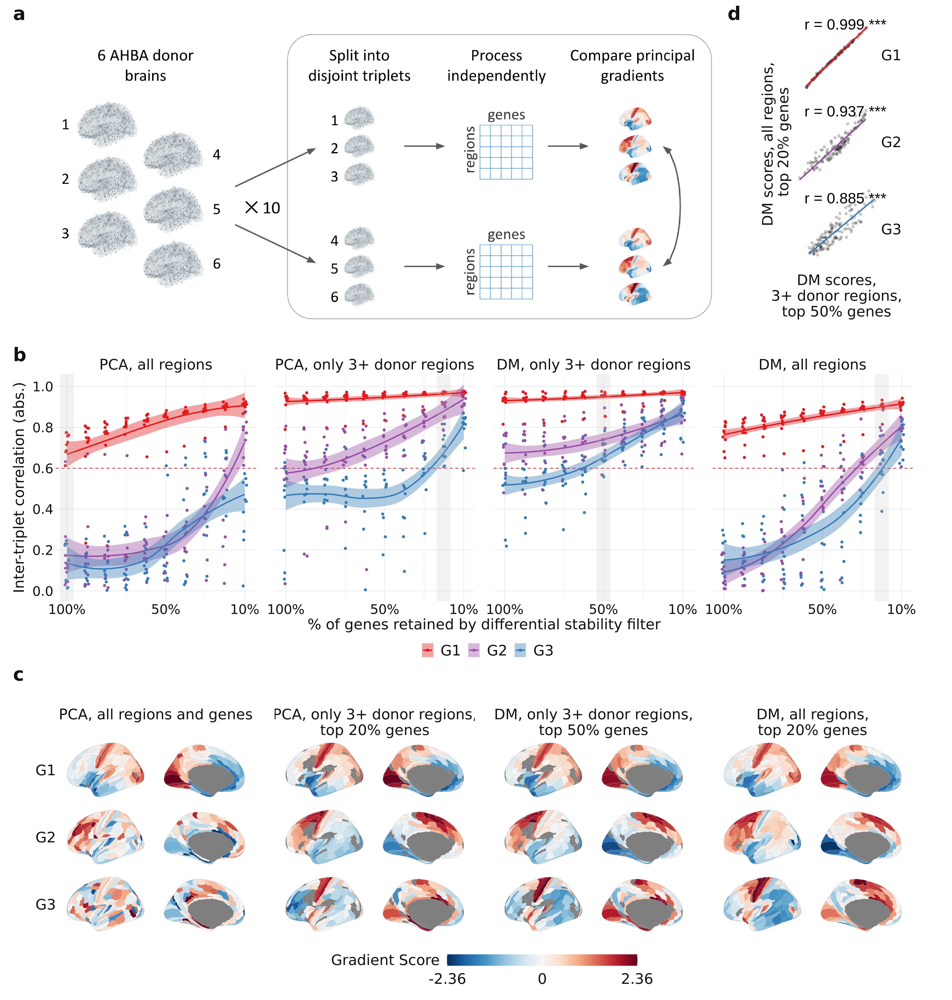

In [13]:
%%R -w 20 -h 21 --units in -r 200 -i triplets_plot_v2 -i versions_scores -i df_triplets_highlight -i versions_scatter
source("../code/Rplots.R")
source("../code/brainPlots.R")
# source("../code/brainspanPlots.R")
library(magick)
img <- image_read("../data/schematics/fig1_schem.png")

g0 <- image_ggplot(img)
g2 <- plot_triplets_v2(triplets_plot_v2, facet='h') + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey') +
    theme(axis.text.y=element_text(margin=margin(r=-40))
          # axis.title.y=element_text(margin=margin(r=-10))
         )
# g3a <- plot_hcp(hcp_scores %>% filter(str_detect(version, 'PCA')), spacing_x=2) + theme(legend.position='none', strip.text.y=element_text(margin=margin(l=10)))
# g3b <- plot_hcp(hcp_scores %>% filter(str_detect(version, 'DM')), spacing_x=2) + theme(legend.position='bottom', strip.text.y=element_text(margin=margin(l=10))) + 
#         guides(fill=guide_colorbar(title='Score', barwidth=10, title.vjust=1)) + plot_layout(tag_level='new')
g3 <- plot_hcp(versions_scores, spacing_x=2, switch='y') + 
    guides(fill=guide_colorbar(barwidth=20, title='Gradient Score', title.vjust=1)) +
    theme(strip.text.y=element_text(margin=margin(l=10)))
g4 <- plot_scatter_corrs(versions_scatter, size=8,
                         xlab='DM scores,\n3+ donor regions,\ntop 50% genes', 
                         ylab='DM scores, all regions, \ntop 20% genes')

caption <- paste("**Figure 1:**",
                "**a**, Schematic of triplet method to ensure generalizability of AHBA gradients.",
                "**b**, Correlations of region scores vs % of top DS genes retained, between on independently processed triplets of the six AHBA donor brains, for PCA, DM, and DM when filtered for the 137/180 regions with samples from at least 3 of the 6 donors.",
                        "Grey highlight indicates DS level for brain maps shown in (c)",
                "**c**, Region scores of AHBA gradients in HCP-MMP1.0 parcellation using all six donors; for PCA with all genes, DM with only the top 10% of genes, and DM with the top 50% of genes for only the 137/180 regions with samples from at least 3 of the 6 donors.",
                "**d**, Scatter plots and correlations of gradient scores in HCP-MMP1.0 regions with 3+ donors, for PCA with top 20% of genes and DM with top 50% of genes."
)


layout <- c(
  area(t = 1, b = 18, l = 1, r = 39),
  area(t = 19, b = 33, l = 1, r = 48),
  area(t = 34, b = 48, l = 1, r = 48),
  # area(t = 6, b = 7, l = 6, r = 10),
  area(t = 1, b = 17, l = 40, r = 48)
)

plot <- g0 + g2 + g3 + g4 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated
# ggsave(filename='test2.png', device='png')

---

# Fig 2

In [4]:
weights_version = dm_hcp_3d_ds5

In [5]:
weights = weights_version.weights.iloc[:,:3]
nulls = shuffle_gene_weights(weights, n=5000, rank=False)

In [6]:
weights_version_scores = weights_version.clean_scores()

## Gene weight vs DS

In [7]:
stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
weights_ds = weights.set_axis(['G1','G2','G3'],axis=1).join(stability)

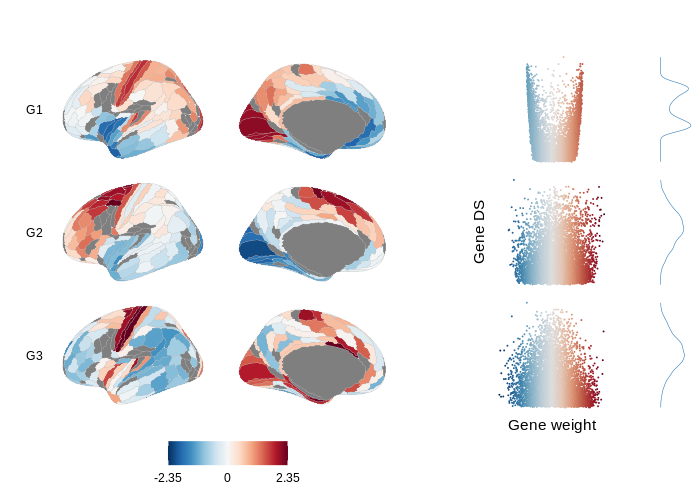

In [8]:
%%R -i weights_version_scores -i weights_ds -w 7 -h 5 --units in -r 100
source("../code/brainPlots.R")
source("../code/Rplots.R")
(plot_hcp(weights_version_scores, switch='y') | 
 plot_weights_ds(weights_ds, ncol=1) |
 plot_weights_dist(weights_ds)
) + plot_layout(widths=c(12,6,1))

## Gene maps

In [9]:
# celltypes = ['Astro', 'Micro', 'Oligo']
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
cell_genes = get_cell_genes(which='jakob', add_synapses=True) #.loc[lambda x: np.isin(x['label'], celltypes)]
gene_maps = make_gene_maps(weights_version, cell_genes, order=order, normalize='std', method='mean')

In [10]:
# # single_genes = ['ALDH1L1','AIF1','MOG']
# # single_genes = pd.DataFrame({'gene':single_genes, 'label':single_genes})
# # single_gene_maps = make_gene_maps(weights_version, single_genes, normalize='std', method='mean')

# gene_maps = (pd.concat([single_gene_maps, cell_gene_maps], axis=1)
#              .apply(lambda x: (x-np.mean(x))/np.std(x))
#             )

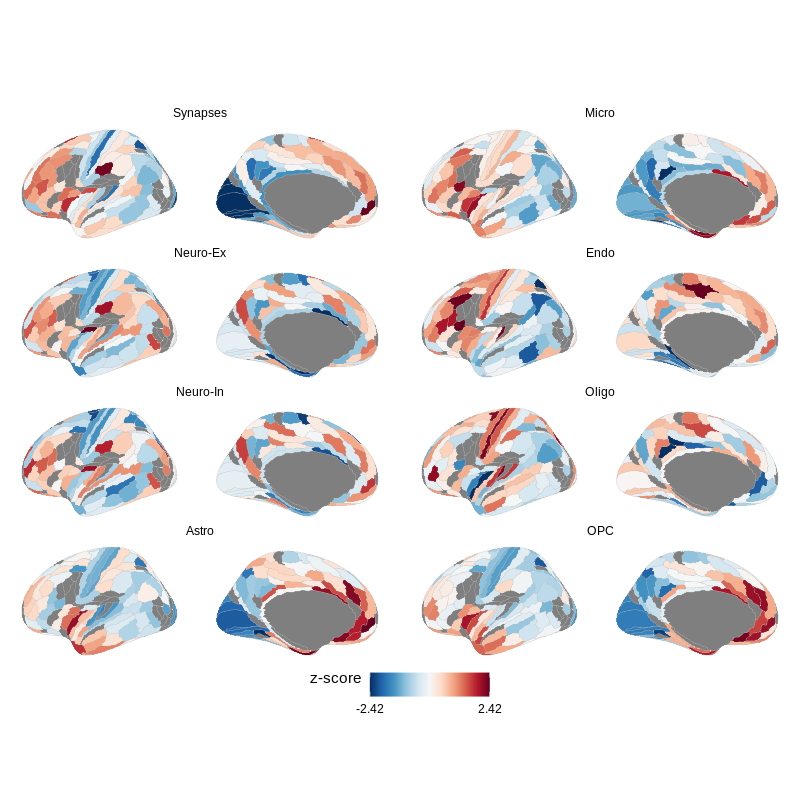

In [11]:
%%R -i gene_maps -w 8 -h 8 --units in -r 100
source("../code/plot_maps.R")
colors <- rev(brewer.rdbu(100))
# p1 <- plot_maps(single_gene_maps, ncol=1, colors=colors, colorscale='absolute')
# p2 <- plot_maps(cell_gene_maps, ncol=1, colors=colors, colorscale='absolute')
# p1 | p2
plot_maps(gene_maps, ncol=2, colors=colors, colorscale='absolute')

## Cell enrichments

In [12]:
cell_genes = get_cell_genes(which='jakob', add_synapses=True)
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
true_scores, null_scores = compute_enrichments(weights, nulls, cell_genes, how='mean')
cell_null_p = compute_null_p(true_scores, null_scores, adjust='fdr_bh', order=order)

In [13]:
cell_rename = {
    'Neuro-Ex':'Neurons (Ex.)',
    'Neuro-In':'Neurons (In.)',
    'Astro':'Astrocytes',
    'Micro':'Microglia',
    'Endo':'Endothelial cells',
    'Oligo':'Oligodendrocytes',
    'OPC':'OPC'
}
    
cell_null_p = cell_null_p.replace({'label':cell_rename})
gene_maps = gene_maps.rename(cell_rename, axis='columns')

## GO enrichments

In [14]:
go_enrichments = combine_enrichments('dm_hcp_3d_ds5', 'Process', include_g1=False, top_n=5, filter_001=False) 
go_enrichments = go_enrichments.replace({'G':{'G2':'G2: metabolic – epigenetic', 'G3':'G3: immune – synaptic'}})

## Brainspan mapping

In [15]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()

In [16]:
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_agg = aggregate_brainspan_by_age(bs_clean)

## Brainspan development

In [17]:
hcp_mapped_scores = get_mapped_scores(weights_version, hcp_bs_mapping)
bs_scores = compute_brainspan_scores(bs_agg, weights_version)

In [18]:
age_groups = get_age_groups()
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=age_groups)

In [19]:
bs_scores_corr

,age,G,corr
0,Pre-Birth,G1,0.658120
1,Birth-13 yrs,G1,0.883127
2,18-40 yrs,G1,0.957969
3,Pre-Birth,G2,0.712516
4,Birth-13 yrs,G2,0.900534
5,18-40 yrs,G2,0.881570
6,Pre-Birth,G3,0.309234
7,Birth-13 yrs,G3,0.621012
8,18-40 yrs,G3,0.837535


## Brainspan adult correlation

In [20]:
both_scores, both_corrs = combine_scores(bs_scores, hcp_mapped_scores, age_groups)

In [21]:
scores_plot = make_brain_plots(weights_version, hcp_bs_mapping, bs_scores).replace({'version':{'BrainSpan':'BrainSpan 18-40yrs'}})

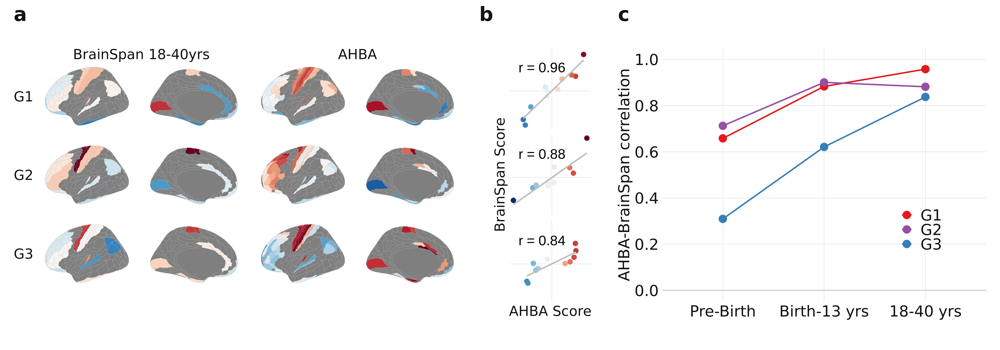

In [27]:
%%R -w 20 -h 7 --units in -r 200 -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainspanPlots.R")
source("../code/brainPlots.R")

# g10 <- plot_bs_hcp_mapping(hcp_bs_mapping, xlab='BrainSpan regions\nmatched to HCP-MMP1.0') + theme(plot.margin=margin(r=-50, 'pt'), plot.tag.position=c(0,.95))
g11 <- plot_hcp(scores_plot, facet='h', switch='y') + theme(
            plot.tag.position = c(0.1, .9),
            strip.text.x=element_text(size=20), 
            strip.text.y.left=element_text(size=20, margin=margin(l=0)),
            legend.position='none',
            panel.spacing.y = unit(1, 'lines')
            )
g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='v', size=3) + theme(
            strip.text.y = element_blank(),
            axis.title.y = element_text(angle=90)
)
g13 <- plot_bs_scores_corr(bs_scores_corr) + 
    theme(legend.position=c(.8,.3), plot.tag.position = c(0, .95),
          axis.text=element_text(size=22, color='grey7', family='Calibri')
         )
    
layout <- c(
    # area(t=1,b=24,l=1,r=8),
    # area(t=1,b=24,l=9,r=30),
    area(t=1,b=24,l=1,r=24),
    area(t=1,b=24,l=25,r=30),
    area(t=1,b=24,l=31,r=48)
)

# plot <- g10 + g11 + g12 + g13 + plot_layout(design=layout)
plot <- g11 + g12 + g13 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # axis.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

g_brainspan = themed + plot_annotation(tag_level='a')
g_brainspan

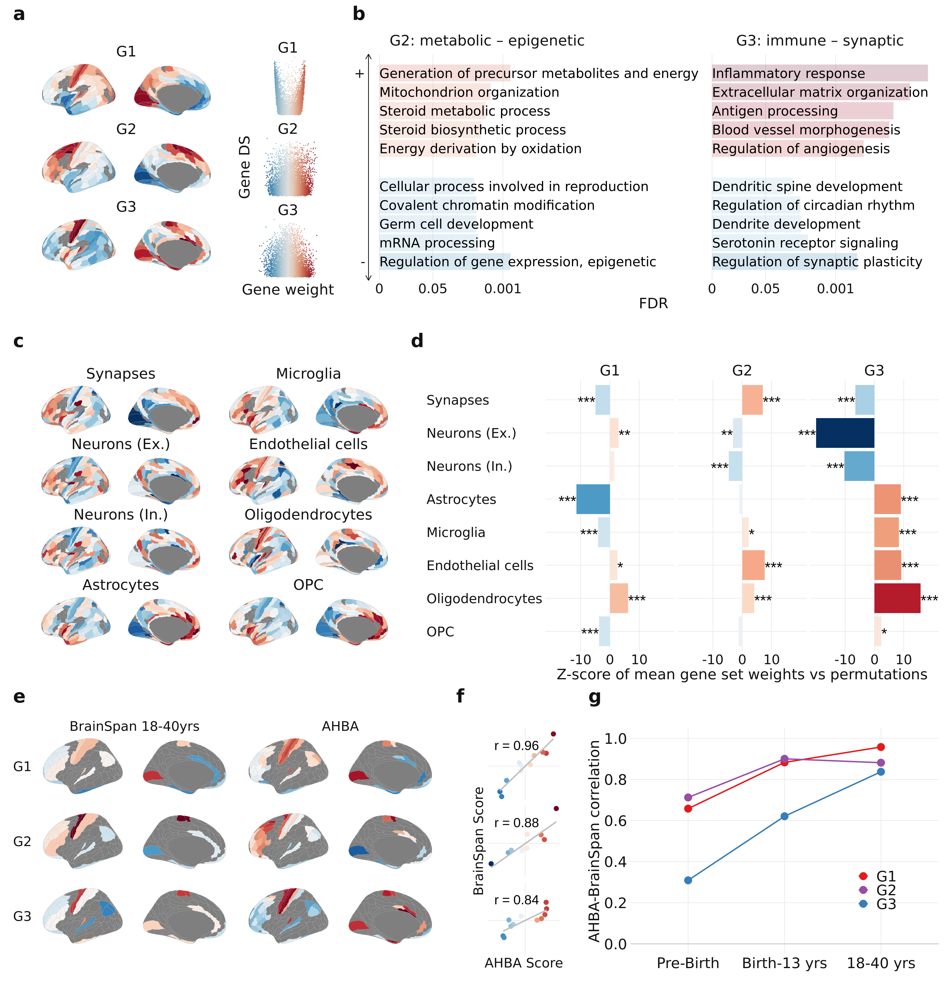

In [28]:
%%R -w 20 -h 21 --units in -r 200 -i weights_version_scores -i weights_ds -i go_enrichments -i gene_maps -i cell_null_p -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainPlots.R")
source("../code/enrichmentsPlots.R")
source("../code/brainspanPlots.R")


# g1a <- plot_hcp(hcp_scores %>% mutate(version='Region scores'), switch='both') + 
g1a <- plot_hcp(weights_version_scores, facet='w') + 
    guides(fill='none') + theme(strip.text=element_text(size=20))
    # theme(strip.text.y.left=element_text(size=20),strip.text.x.bottom=element_text(size=20,vjust=0))
g1b <- plot_weights_ds(weights_ds,ncol=1) + plot_layout(tag_level='new')
# g1c <- plot_weights_dist(weights_ds) + plot_layout(tag_level='new')
g2 <- plot_go_enrichments(go_enrichments, size=7) #+ plot_annotation(theme=theme(plot.margin=margin(l=-50, unit='pt')))
g3 <- plot_maps(gene_maps, ncol=2, colors=colors, colorscale='absolute') + guides(fill='none') + 
        theme(panel.spacing.x=unit(1, 'lines'))
# g3b <- plot_maps(cell_gene_maps, ncol=1, colors=colors, colorscale='absolute')
g4 <- plot_enrichment_bars_z(cell_null_p, xlab='Z-score of mean gene set weights vs permutations') + theme(axis.text.y=element_text(hjust=0))


# g11 <- plot_hcp(scores_plot, facet='h', switch='y') + theme(
#             strip.text.x=element_text(size=20), 
#             strip.text.y.left=element_text(size=20, margin=margin(l=0)),
#             legend.position='none',
#             panel.spacing.y = unit(1, 'lines')
#             )
# g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='v', size=3) + theme(
#             strip.text.y = element_blank(),
#             axis.title.y = element_text(angle=90)
# )
# g13 <- plot_bs_scores_corr(bs_scores_corr) + theme(legend.position=c(.8,.3))
    

layout <- c(
    area(t=1,b=15,l=1,r=13),
    area(t=1,b=15,l=14,r=18),
    # area(t=1,b=15,l=18,r=19),    
    
    area(t=1,b=15,l=20,r=48),
    
    area(t=16,b=33,l=1,r=21),
    area(t=16,b=33,l=22,r=48),

    area(t=34,b=48,l=1,r=48)    
    # area(t=34,b=48,l=1,r=21),
    # area(t=34,b=48,l=21,r=24),
    # area(t=34,b=48,l=25,r=48)
)
    
# plot <- g1a + g1b + g2 + g3 + g4 + g11 + g12 + g13 + plot_layout(design=layout)
plot <- g1a + g1b + g2 + g3 + g4 + g_brainspan + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

# Fig 3 — maps

In [57]:
maps=get_maps()
hcp_scores = dm_hcp_ds8.clean_scores()
# hcp_scores = dm_hcp_3d_ds5.clean_scores()
# hcp_scores = pca_hcp_3d_ds8.clean_scores()
corrs = get_corrs(hcp_scores, maps, method='pearson')
corrs

,G1,G2,G3
T1T2,0.747238,-0.223904,0.198033
thickness,-0.670373,0.082331,0.009519
G1_fMRI,-0.423108,0.285461,-0.248588
PC1_neurosynth,-0.217902,-0.197998,-0.304635
externopyramidisation,0.139278,-0.486833,-0.299247
glasser_GI,0.174754,0.684880,0.016100
hill.evo_remapped,-0.232264,0.484026,-0.191165
hill.dev_remapped,-0.085652,0.453910,0.049957
glasser_CBF,0.207820,0.405969,0.246288
allom,0.213465,0.272076,-0.191025


In [58]:
null_grads = np.load("../outputs/permutations/hcp_ds8_sim_5000.npy")
# null_grads = np.load("../outputs/permutations/sim_gradients_1000.npy")
null_corrs = corr_nulls_from_grads(null_grads, hcp_scores, maps, method='pearson')
null_p = get_null_p(corrs, null_corrs, adjust=None)

In [59]:
long_names = {
        'T1T2':'Myelination (T1w/T2w)',
        'thickness':'Thickness (CT)',    
        'G1_fMRI': 'fMRI connectivity G1',
        'PC1_neurosynth': 'NeuroSynth PC1 (NS PC1)',    
        #'glasser_CMRO2':'Oxy. Metabolism (CMRO2)',
        # 'glasser_CMRGlu':'Glu. Metabolism (CMRGlu)',
        'allom':'Allometric Scaling (Allom.)',  
        'glasser_GI':'Aerobic Glycolysis (AG)',
        'hill.evo_remapped':'Evolutionary Expansion (Evo. Exp.)',
        'hill.dev_remapped':'Dev. Expansion (Dev. Exp.)',
        'glasser_CBF':'Cerebral Blood Flow (CBF)',
        'externopyramidisation':'Externopyramidisation (Ext.)'
}
    
short_names = {
        'T1T2':'T1w/T2w',
        'thickness':'CT',
        'G1_fMRI':'fMRI G1',
        'PC1_neurosynth':'NS PC1',    
        # 'glasser_CMRO2':'CMRO2',
        # 'glasser_CMRGlu':'CMRGlu',
        'glasser_GI':'AG',
        'hill.dev_remapped':'Dev. Exp.',
        'hill.evo_remapped':'Evo. Exp.',
        'externopyramidisation':'Externo.',
        'glasser_CBF':'CBF',
        'allom':'Allom.'
}
null_p_rename = null_p.assign(map_name = lambda x: x['map'].map(short_names),
                              map = lambda x: x['map'].map(long_names)
                      ).set_index('map').loc[long_names.values()].reset_index()
maps_rename = maps.rename(columns=long_names).loc[:,long_names.values()]

## Scatter

In [104]:
# maps_scatter_names = {
#     # 'Myelination (T1w/T2w)':'Myelination\n(T1w/T2w)',
#     'Oxygen Metabolism (CMRO2)':'Oxygen\nMetabolism',
#     'Glycolytic Index (AG)':'Glycolytic\nIndex'
# }
# maps_scatter = (maps
#                 .loc[:,maps_scatter_names.keys()]
#                 .melt(ignore_index=False, var_name='map', value_name='map_score')
#                 .join(hcp_scores.set_index('label')).reset_index()
#                 .replace({'map':maps_scatter_names})
#                 .drop('G3',axis=1)
#                )
# maps_scatter_corrs = (null_p.query("map in @maps_scatter_names.keys()")
#                       .loc[:,['map','G','true_mean','q']]
#                       .replace({'map':maps_scatter_names})
#                       .loc[lambda x: x['G'] != 'G3']
#                      )

## PCA

In [60]:
pca_scores, pca_var, pca_weights = maps_pca(maps, short_names)
pca_scores = (pca_scores.iloc[:,[0,1]] * [-1,-1]).reset_index()

In [61]:
pca_weights

,MRI PC1,MRI PC2,MRI PC3,map_name
T1T2,0.332366,-0.409737,0.207512,T1w/T2w
thickness,-0.192132,0.457254,-0.265105,CT
G1_fMRI,-0.419280,0.281886,0.375155,fMRI G1
PC1_neurosynth,-0.052920,0.418097,0.607794,NS PC1
externopyramidisation,0.321587,0.248761,-0.020594,Externo.
glasser_GI,-0.414454,-0.258373,0.294931,AG
hill.evo_remapped,-0.385018,-0.027477,-0.410459,Evo. Exp.
hill.dev_remapped,-0.379048,-0.062994,-0.170270,Dev. Exp.
glasser_CBF,-0.179644,-0.416512,0.285869,CBF
allom,-0.273211,-0.248848,-0.099529,Allom.


In [62]:
pca_var

array([0.31103521, 0.19970867, 0.14094252])

In [63]:
ahba_scores = hcp_scores.drop('G3', axis=1).set_axis(['G1', 'G2', 'label'], axis=1)

In [64]:
maps_pca_scatter = (pd.concat({
    'MRI PCA': pca_scores.set_axis(['label','G2','G1'],axis=1).set_index('label'),
    'AHBA DM': hcp_scores.drop('G3', axis=1).set_index('label')}, 
    axis=1)
 .stack(1).reset_index().rename({'level_1':'G'},axis=1)
 .replace({'G':{'G1':'MRI PC2 vs G1', 'G2':'MRI PC1 vs G2'}})
 .sort_values('G')
)
maps_pca_scatter

,label,G,AHBA DM,MRI PCA
179,10pp,MRI PC1 vs G2,0.057816,0.666113
187,47s,MRI PC1 vs G2,-0.261840,0.561460
189,LIPd,MRI PC1 vs G2,0.345449,0.764358
191,6a,MRI PC1 vs G2,1.878771,0.204584
193,i6-8,MRI PC1 vs G2,1.913182,1.417963
...,...,...,...,...
72,5mv,MRI PC2 vs G1,0.354070,0.303531
216,MI,MRI PC2 vs G1,-1.798785,-0.603074
218,Pir,MRI PC2 vs G1,-1.185329,-2.104701
204,52,MRI PC2 vs G1,-0.811688,0.165480


In [65]:
pca_corrs = get_corrs(hcp_scores, pca_scores.set_index('label'))
pca_null_corrs = corr_nulls_from_grads(null_grads, hcp_scores, pca_scores, method='pearson')
pca_null_p = get_null_p(pca_corrs, pca_null_corrs, adjust='fdr_bh')
maps_pca_corrs = (pca_null_p
                     .loc[:,['map','G','true_mean','q']]
                     .loc[lambda x: (x['G']=='G1') & (x['map']=='MRI PC2') | 
                                    (x['G']=='G2') & (x['map']=='MRI PC1')]
                     .replace({'G':{'G1':'MRI PC2 vs G1', 
                                    'G2':'MRI PC1 vs G2'}})
                    )

In [66]:
pca_null_p

,map,G,pct,true_mean,null_mean,null_std,z,pos,p,sig,q
0,MRI PC1,G1,0.160032,-0.322939,0.004214,0.293397,-1.115055,False,0.320064,False,0.431126
1,MRI PC1,G2,0.999000,0.647305,-0.008174,0.314736,2.082632,True,0.002000,True,0.012002
2,MRI PC1,G3,0.415683,-0.078534,0.001439,0.294266,-0.271769,False,0.831366,False,0.831366
3,MRI PC2,G1,0.996599,0.688257,-0.001286,0.307498,2.242434,True,0.006801,True,0.020404
4,MRI PC2,G2,0.828966,0.320064,-0.006991,0.312826,1.045485,True,0.342068,False,0.431126
5,MRI PC2,G3,0.820364,0.294706,0.009628,0.284294,1.002758,True,0.359272,False,0.431126


In [67]:
# %%R -i maps_pca_scatter -i maps_pca_corrs
# source("../code/plot_maps.R")
# plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs)

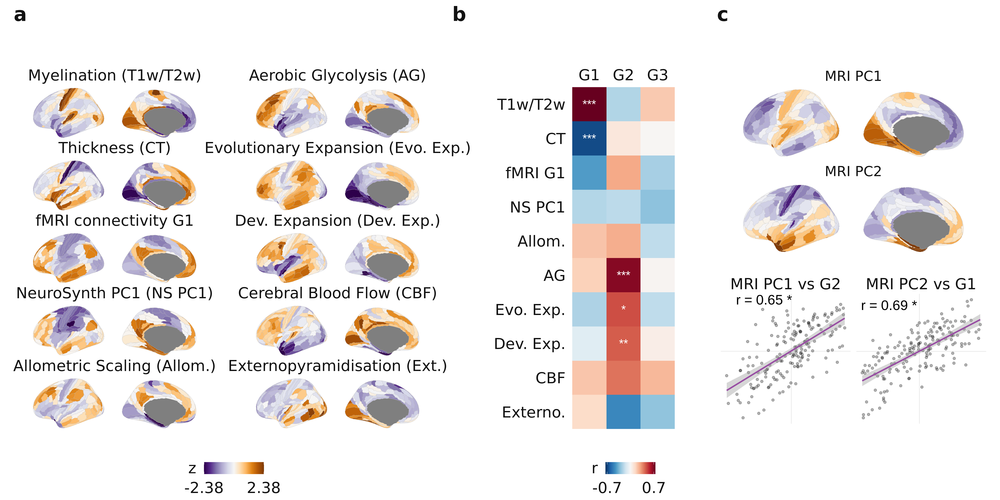

In [68]:
%%R -w 20 -h 10 --units in -r 200 -i maps_rename -i null_p_rename -i pca_weights -i pca_scores -i ahba_scores -i maps_pca_scatter -i maps_pca_corrs
source("../code/plot_maps.R") 

g1 <- plot_maps(maps_rename, ncol=2, colors=rev(brewer.puor(100)), spacing=0) + theme(
            legend.position='bottom',
            # legend.margin=margin(t = -60, unit='pt'),
            panel.spacing.x = unit(4, 'lines'),
            plot.tag.position = c(0, 1))
g2 <- plot_map_corrs(null_p_rename) + theme(
            # legend.margin=margin(t = -60, unit='pt'),
            plot.tag.position = c(0, 1)) & theme(axis.text=element_text(size=22))
# g3 <- plot_maps_scatter(maps_scatter, maps_scatter_corrs) + theme(plot.tag.position = c(0.1, 1))
# g4 <- plot_pca_weights(pca_weights) + theme(plot.tag.position = c(0, 1))
g5 <- plot_ahba_mri_brains(pca_scores, colors=brewer.puor(100), ncol=1)
# g5b <- plot_ahba_mri_brains(ahba_scores) + plot_layout(tag_level='new')
g6 <- plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs, size=7, ncol=2) + plot_layout(tag_level='new')

layout <- c(
  # All maps
  area(t = 1, b = 48, l = 1, r = 24),
  # All corrs
  area(t = 1, b = 48, l = 25, r = 33),
  # Scatter corrs
  # area(t = 1, b = 24, l = 24, r = 48),
  # area(t = 1, b = 12, l = 21, r = 48),
  # area(t = 13, b = 24, l = 21, r = 48),
  # PCA weights
  # area(t = 25, b = 48, l = 17, r = 23),
  # PCA brains
  area(t = 1, b = 26, l = 34, r = 48),
  # AHBA brains
  # area(t = 11, b = 20, l = 30, r = 48),
  # PCA-AHBA scatter
  area(t = 27, b = 48, l = 34, r = 48)

)

plot <- g1 + g2 + g5 + g6 + plot_layout(design=layout)

plot + plot_annotation(tag_level='a') & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=0, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

## Mesulam VE Yeo

In [69]:
mesulam_ve_yeo = pd.read_csv('../data/mesulam_ve_yeo.csv')
mesulam_ve_yeo_scores_sig = pd.read_csv('../outputs/mesulam_ve_yeo_scores_sig.csv')

In [70]:
%%R -w 10 -h 5 --units in -r 100 -i mesulam_ve_yeo_scores_sig -i mesulam_ve_yeo
source('../code/brainPlots.R')
source('../code/Rplots.R')
a1 = plot_hcp_classes(mesulam_ve_yeo, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names)
a2 = plot_hcp_classes(mesulam_ve_yeo, classes=vonEconomo, classcolors=vonEconomo_colors, classnames=vonEconomo_names) + plot_layout(tag_level = 'new')
a3 = plot_hcp_classes(mesulam_ve_yeo, classes=Yeo, classcolors=Yeo_colors, classnames=Yeo_names) + plot_layout(tag_level = 'new')
g1 = plot_atlas_score_dots(mesulam_ve_yeo_scores_sig) + plot_layout(tag_level = 'new')
           
atlases_plot = (a1 | a2 | a3) / g1

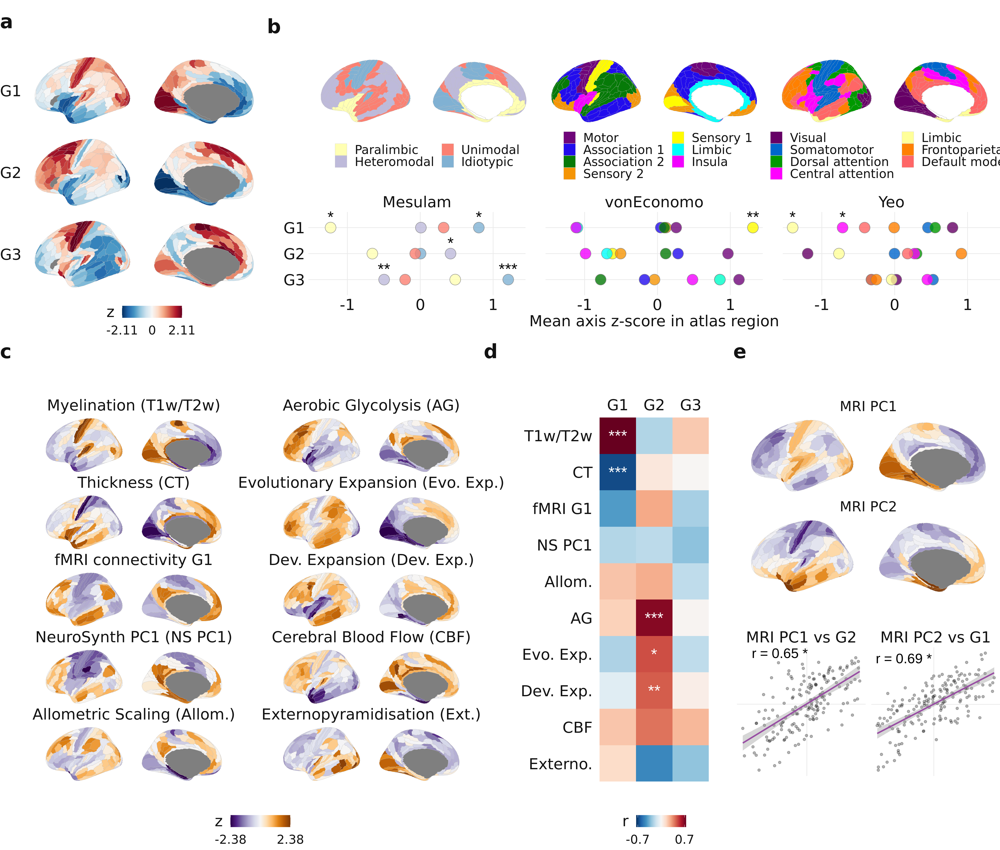

In [75]:
%%R -w 20 -h 17 --units in -r 200 -i hcp_scores -i maps_rename -i null_p_rename -i pca_weights -i pca_scores -i ahba_scores -i maps_pca_scatter -i maps_pca_corrs
source("../code/plot_maps.R") 

g1 <- plot_hcp(hcp_scores, switch='y') + theme(legend.margin=margin(t = -40, unit='pt'))
g2 <- atlases_plot
g3 <- plot_maps(maps_rename, ncol=2, colors=rev(brewer.puor(100)), spacing=0) + theme(
            legend.position='bottom',
            # legend.margin=margin(t = -60, unit='pt'),
            panel.spacing.x = unit(4, 'lines'),
            plot.tag.position = c(0, 1))
g4 <- plot_map_corrs(null_p_rename, size=8) + theme(
            # legend.margin=margin(t = -60, unit='pt'),
            plot.tag.position = c(0, 1)) & theme(axis.text=element_text(size=22))
g5 <- plot_ahba_mri_brains(pca_scores, colors=brewer.puor(100), ncol=1)
g6 <- plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs, size=7, ncol=2) + plot_layout(tag_level='new')

layout <- c(
  # Axes
  area(t = 1, b = 20, l = 1, r = 14),    
  # VE etc
  area(t = 1, b = 20, l = 15, r = 48),
  # All maps
  area(t = 21, b = 48, l = 1, r = 24),
  # All corrs
  area(t = 21, b = 48, l = 25, r = 33),
  # PCA brains
  area(t = 21, b = 35, l = 34, r = 48),
  # AHBA brains
  # area(t = 11, b = 20, l = 30, r = 48),
  # PCA-AHBA scatter
  area(t = 37, b = 48, l = 34, r = 48)

)

plot <- g1 + g2 + g3 + g4 + g5 + g6 + plot_layout(design=layout)

(plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=0, b=0, l=0, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

For slides

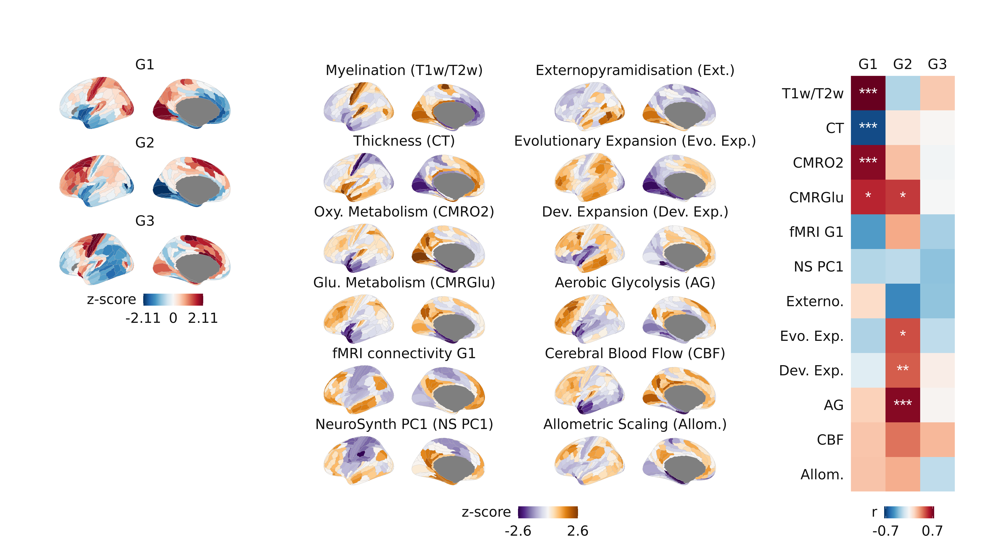

In [20]:
%%R -w 20 -h 11 --units in -r 300 -i maps_rename -i null_p_rename -i pca_weights -i pca_scores -i ahba_scores -i maps_pca_scatter -i maps_pca_corrs -i hcp_scores
source("../code/brainPlots.R") 
source("../code/plot_maps.R") 

g0 <- plot_hcp(hcp_scores, facet='w', name='z-score') + theme(
    plot.margin = margin(t=0, r=50, b=0, l=10, "pt")
)

g1 <- plot_maps(maps_rename, ncol=2, colors=rev(brewer.puor(100)), spacing=0) + theme(
            legend.position='bottom',
            # legend.margin=margin(t = -60, unit='pt'),
            panel.spacing.x = unit(5, 'lines'),
            plot.tag.position = c(0, 1))
g2 <- plot_map_corrs(null_p_rename, size=8) + theme(
            # legend.margin=margin(t = -60, unit='pt'),
            plot.tag.position = c(0, 1),
            axis.text=element_text(size=20)
)

layout <- c(
  # Gradients
  area(t = 1, b = 27, l = 1, r = 15),    
  # All maps
  area(t = 1, b = 48, l = 16, r = 38),
  # All corrs
  area(t = 1, b = 48, l = 39, r = 48)
)

plot <- g0 + g1 + g2 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20, color='grey7', family='Calibri'),
    strip.text=element_text(size=20, color='grey7', family='Calibri'),
    legend.text=element_text(size=20, color='grey7', family='Calibri'),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
themed

---

# Figure 4

In [29]:
weights_version = dm_hcp_3d_ds5
weights = dm_hcp_3d_ds5.weights.iloc[:,:3]
nulls = shuffle_gene_weights(weights, n=5000, rank=False)

## Disorder weight scatters

In [30]:
gandal_genes = get_gandal_genes()
weights_labels = get_gene_weights_with_labels(weights, gandal_genes).assign(label = lambda x: pd.Categorical(x['label'], 
                                                                     categories=['ASD','SCZ','MDD'], ordered=True))

## Disorder enrichments

In [31]:
gandal_genes_enrichment_dict = {
    'upreg.': get_gene_sig(weights, nulls, gandal_genes, posneg='pos'),
    'downreg.': get_gene_sig(weights, nulls, gandal_genes, posneg='neg'),
}

In [32]:
gandal_genes_enrichment = (pd.concat(gandal_genes_enrichment_dict)
                           # .assign(updown = lambda x: x.index.get_level_values(0).astype('str'))
                           .assign(label = lambda x: pd.Categorical(x['label'], 
                                                                     categories=['ASD','SCZ','MDD'], ordered=True))
                           .assign(updown = lambda x: pd.Categorical(x.index.get_level_values(0).astype('str'), 
                                                                     categories=['upreg.','downreg.'], ordered=True))
                           .sort_values(['label','updown'])
                           .assign(label = lambda x: x['label'].astype('str') + ' ' + x['updown'].astype('str'))
                          )

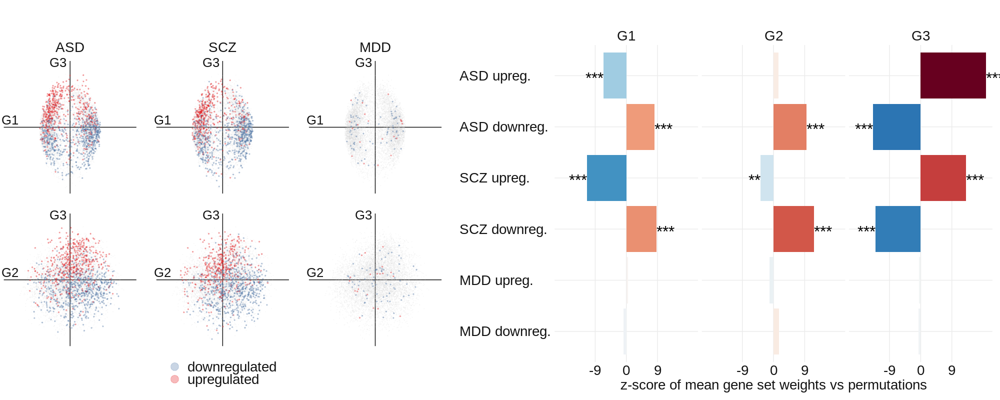

In [54]:
%%R -i weights_labels -i gandal_genes_enrichment -w 20 -h 8 --units in -r 100
source('../code/enrichmentsPlots.R')
g1 <- plot_weight_scatters_with_labels(weights_labels, colors=rev(brewer.set1(10)[1:2]), drop='G1 v G2') + guides(colour = guide_legend(override.aes = list(size=5)))
g2 <- plot_enrichment_bars_z(gandal_genes_enrichment, xlab='z-score of mean gene set weights vs permutations') + theme(axis.text.y = element_text(hjust=0))
plot1 <- g1 + g2
plot1

## Brainchart disorder maps

In [34]:
brainchart_maps = get_disorder_maps().loc[:,['ASD','SCZ','MDD']].apply(lambda x: (x-np.mean(x))/np.std(x))

In [35]:
dk_scores = dm_hcp_3d_ds5.score_in_dk()
# dk_scores = dm_hcp_ds8.score_in_dk()

## Brainchart disorder heatmap

In [36]:
# dk_null_grads = np.load(f"../outputs/permutations/sim_dk_10000_dm_hcp_3d_ds5_vertices.npy")
# dk_null_grads = np.load(f"../outputs/permutations/spin_dk_1000_dm_hcp_3d_ds5_vertices.npy")
dk_null_grads = np.load(f"../outputs/permutations/spin_dk_5000_dm_hcp_3d_ds5_vertices.npy")
# dk_null_grads = np.load(f"../outputs/permutations/shuffle_dk_5000_dm_hcp_3d_ds5_vertices.npy")
# dk_null_grads = np.load(f"../outputs/permutations/shuffle_gradients_dk_1000_dm_hcp_3d_ds5_vertices.npy")

In [37]:
corrs = get_corrs(dk_scores, brainchart_maps, method='pearson')
null_corrs = corr_nulls_from_grads(dk_null_grads, dk_scores, brainchart_maps, method='pearson')
brainchart_null_p = get_null_p(corrs, null_corrs, adjust='fdr_bh').assign(map_name=lambda x: x['map'])

In [38]:
brainchart_null_p

,map,G,pct,true_mean,null_mean,null_std,z,pos,p,sig,q,map_name
0,ASD,G1,1.0000,0.473482,0.002242,0.155819,3.024284,True,0.0000,True,0.000000,ASD
1,ASD,G2,0.0004,-0.274470,0.000166,0.096631,-2.842107,False,0.0008,True,0.003600,ASD
2,ASD,G3,0.6304,0.081892,-0.001307,0.235878,0.352721,True,0.7392,False,0.831600,ASD
3,SCZ,G1,0.4956,0.003596,0.002909,0.290620,0.002363,False,0.9912,False,0.991200,SCZ
4,SCZ,G2,0.2840,-0.242276,0.003673,0.322868,-0.761762,False,0.5680,False,0.730286,SCZ
5,SCZ,G3,0.9956,0.435334,-0.001430,0.191973,2.275135,True,0.0088,True,0.026400,SCZ
6,MDD,G1,0.0728,-0.283789,-0.002738,0.184654,-1.522036,False,0.1456,False,0.327600,MDD
7,MDD,G2,0.8836,0.214403,-0.000236,0.172006,1.247860,True,0.2328,False,0.419040,MDD
8,MDD,G3,0.7286,0.129660,-0.003266,0.195997,0.678203,True,0.5428,False,0.730286,MDD


## Brainchart disorder scatters

In [39]:
brainchart_scatter = (brainchart_maps
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(dk_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G',value_name='G_score')
                .reset_index()
               )

brainchart_scatter_corrs = brainchart_null_p.loc[:,['map','G','true_mean','q']]

In [40]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1)
g1b <- plot_dk(dk_scores, facet='w')

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), x=.5, y=-1.5, facet=F)
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=6.5) #+ plot_layout(tag_level='new')


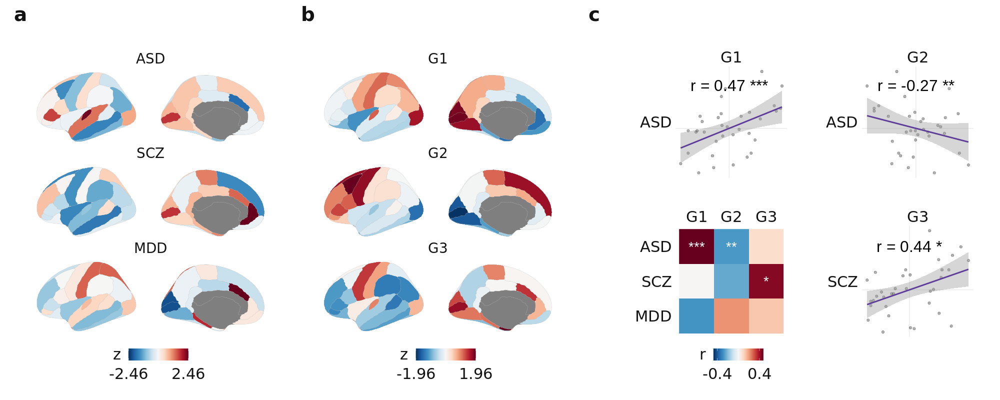

In [53]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1)
g1b <- plot_maps_dk(dk_scores %>% remove_rownames() %>% column_to_rownames('label'), ncol=1)

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), 
                         x=0, y=1.8, facet=F, xlab='G1', ylab='ASD')
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), 
                         x=0, y=1.8, facet=F, xlab='G2', ylab='ASD') + plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), 
                         x=0, y=1.8, facet=F, xlab='G3', ylab='SCZ') + plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=7) + plot_layout(tag_level='new')

g4 <- plot_spacer()

layout <- c(
    area(t=1,b=48,l=1,r=16),
    area(t=1,b=48,l=17,r=32),    
    
    area(t=1,b=24,l=33,r=40),
    area(t=1,b=24,l=41,r=48),
    area(t=25,b=48,l=41,r=48),
    
    area(t=25,b=48,l=33,r=40)
)

plot <- g1a + g1b + g2a + g2b + g2c + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
# themed

plot2 <- themed + plot_annotation(tag_level='a')
plot2

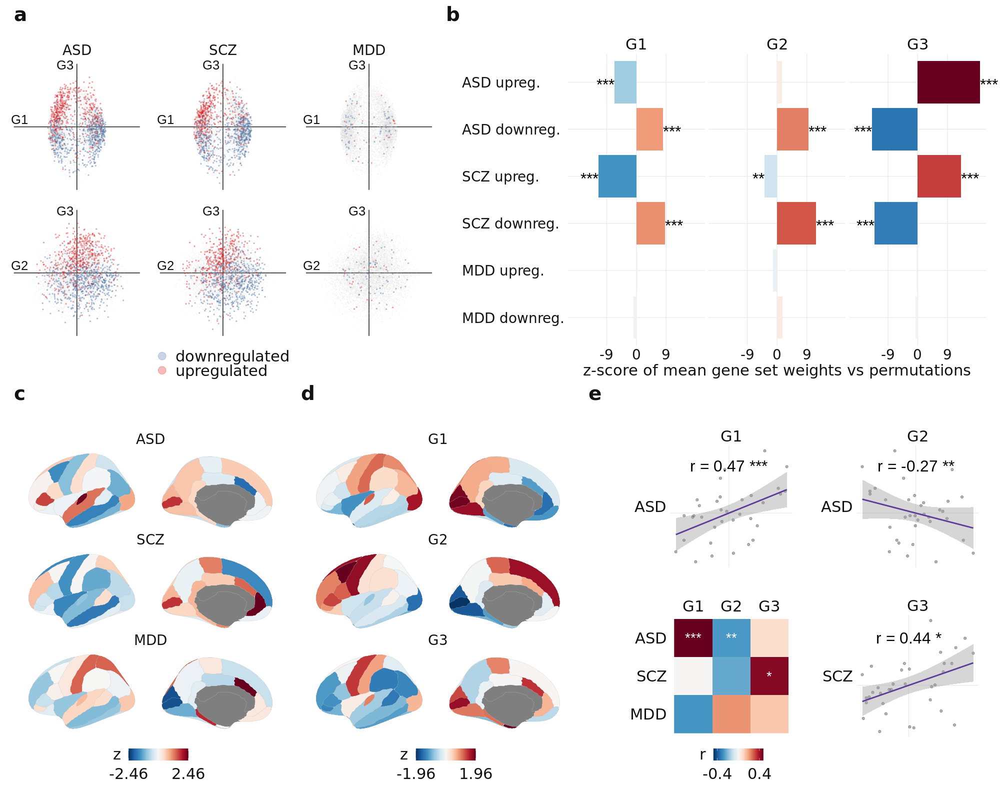

In [55]:
%%R -w 20 -h 16 --units in -r 100
themed <- (plot1 / plot2) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

## Compare with Jake's maps

In [95]:
jake_axes = (pd.read_csv('../data/tx_PLScomps_jake_glasser.csv')
             .set_axis([i+1 for i in range(180)]).join(get_labels_hcp()).set_index('label')
             .apply(lambda x: (x-np.mean(x))/np.std(x))
            )
jake_axes

,TxGrad1,TxGrad2,TxGrad3
label,,,
V1,2.379033,-0.847172,1.729835
MST,0.774669,-1.193433,0.444441
V6,0.613730,-1.369562,1.325712
V2,2.063502,-1.163917,1.681928
V3,1.702069,-1.454998,1.415406
...,...,...,...
STSva,0.613368,-0.252974,-1.729379
TE1m,0.569421,-0.538692,-1.749047
PI,0.805728,0.584211,-1.708206


In [96]:
sim_grads = np.load("../outputs/permutations/hcp_ds8_sim_1000.npy")
# sim_grads = np.load("../outputs/permutations/hcp_3d_ds5_sim_1000.npy")
null_corrs = corr_nulls_from_grads(sim_grads, hcp_scores, jake_axes, method='pearson')
null_p = get_null_p(corrs, null_corrs, adjust=None)

In [114]:
maps_scatter = (jake_axes
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(hcp_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G', value_name='G_score')
                .reset_index()
               )
maps_scatter_corrs = null_p.loc[:,['map','G','true_mean','q']].assign(q=1)

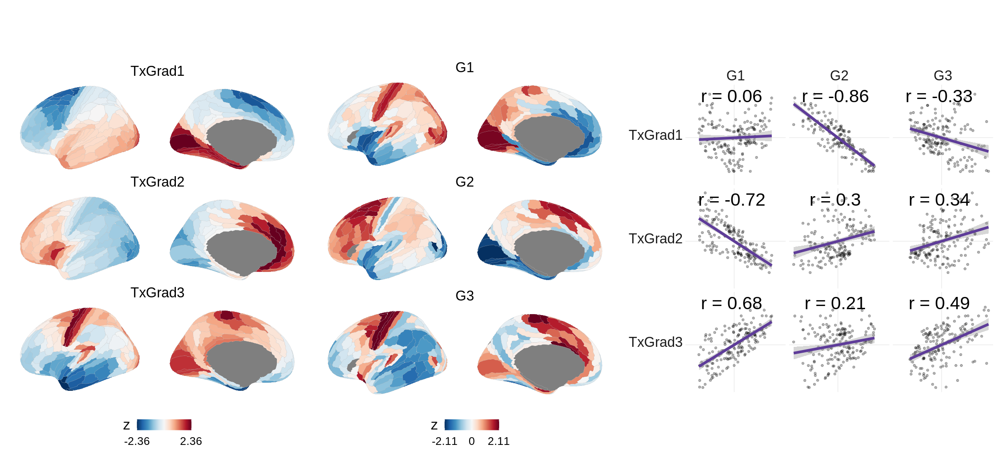

In [119]:
%%R -i hcp_scores -i maps_scatter -i maps_scatter_corrs -i jake_axes -w 22 -h 10 --units in -r 100
source("../code/plot_maps.R")

g1 <- plot_maps(jake_axes, ncol=1, colors=rev(brewer.rdbu(100)), spacing=0) 
g2 <- plot_hcp(hcp_scores, facet='w')
g4 <- plot_maps_scatter(maps_scatter, maps_scatter_corrs, x=0, y=2.5, size=10)

((g1 | g2) | g4) & theme(text=element_text(size=22), strip.text=element_text(size=22))

In [125]:
hcp_scores.corr().round(2)

,G1,G2,G3
G1,1.0,-0.0,0.0
G2,-0.0,1.0,0.0
G3,0.0,0.0,1.0


In [124]:
jake_axes.corr().round(2)

,TxGrad1,TxGrad2,TxGrad3
TxGrad1,1.00,-0.51,-0.29
TxGrad2,-0.51,1.00,-0.22
TxGrad3,-0.29,-0.22,1.00


In [130]:
dm_hcp_ds8.weights.corr().round(2)

,0,1,2,3,4
0,1.00,0.03,-0.02,0.15,0.13
1,0.03,1.00,0.30,0.03,0.21
2,-0.02,0.30,1.00,-0.11,-0.17
3,0.15,0.03,-0.11,1.00,-0.01
4,0.13,0.21,-0.17,-0.01,1.00


In [136]:
dm_hcp_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_diffmap_gene_weights.csv')

## For plotting brains

In [96]:
maps_to_plot = [
    'Myelination (T1w/T2w ratio)',
    'Glycolytic Index (CMRO2/CMRGlu)',
    'Developmental Expansion'
]

hcp_maps = maps.loc[:, maps_to_plot]

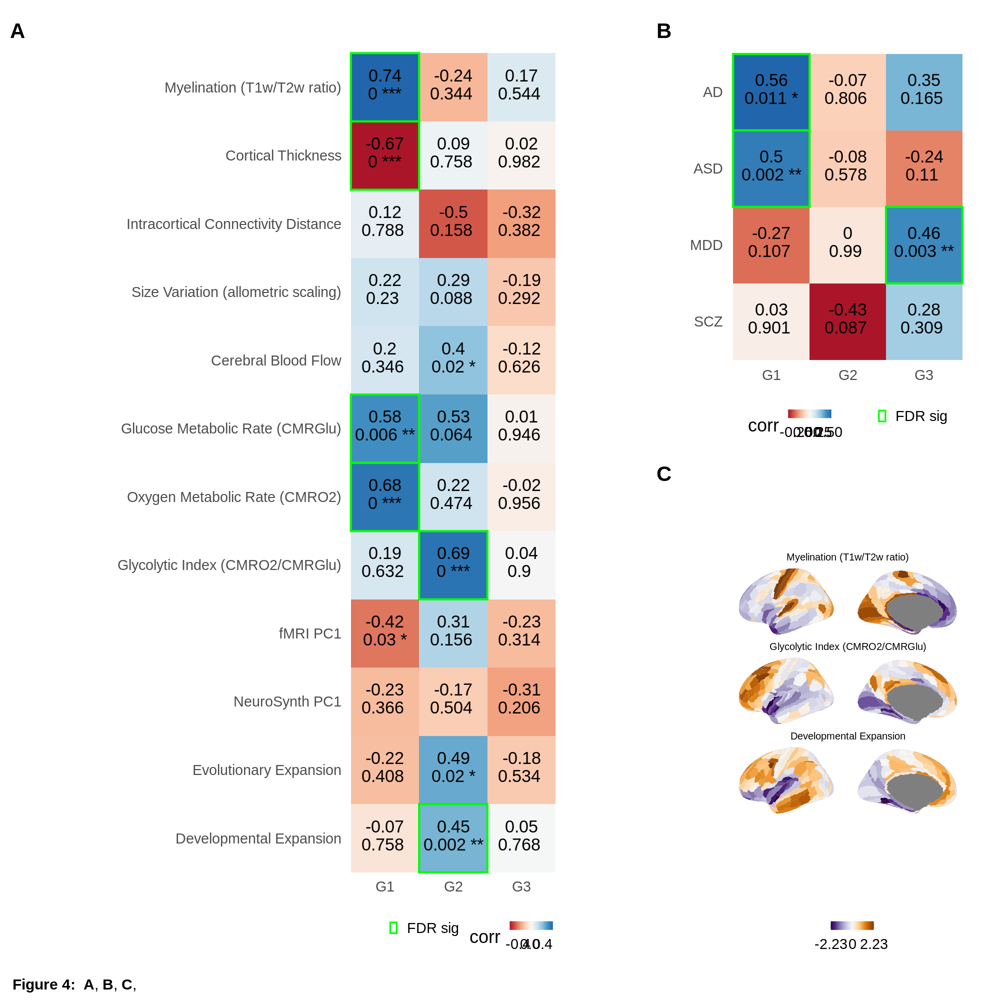

In [191]:
%%R -i mri_corrs -i disorder_corrs -i hcp_maps -w 2000 -h 2000
source("../code/plot_maps.R")
g1 <- plot_corr_versions(mri_corrs, size=12)
g2 <- plot_corr_versions(disorder_corrs, size=12)
g3 <- plot_maps(hcp_maps, ncol=1, colors=rev(brewer.puor(100)))

plot <- (
    g1 | 
    (g2 / g3)
) + plot_layout(widths=c(3,2))

themed <- plot & theme(
    text=element_text(size=36),
    plot.margin = margin(t=10, r=30, b=10, l=10, "pt"),
    plot.tag = element_text(size=42, face='bold', vjust=-2)
)

caption <- paste("**Figure 4:**",
                "**A**, ",
                "**B**, ",
                "**C**, "
)

annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 30, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated